# Atividade 1 - TETI - Processamento de imagens

In [4]:
path = "C:/Users/alice/.anaconda/img/"
#variável de caminho das imagens

In [ ]:
!pip install matplotlib
!pip install opencv-python
!pip install pandas

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pylab import *
%matplotlib inline

In [29]:
def plot_imagens_2(img1, tit1, img2, tit2, tamanho_fig):
    figure(figsize = tamanho_fig)
    plt.subplot(1, 2, 1), plt.imshow(img1), plt.title(tit1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(1, 2, 2), plt.imshow(img2), plt.title(tit2)                
    plt.xticks([]), plt.yticks([])
    plt.show()
    
def plot_imagens_3(img1, tit1, img2, tit2, img3, tit3, tamanho_fig):
    figure(figsize = tamanho_fig)
    plt.subplot(1, 3, 1), plt.imshow(img1), plt.title(tit1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(1, 3, 2), plt.imshow(img2), plt.title(tit2)                
    plt.xticks([]), plt.yticks([])
    plt.subplot(1, 3, 3), plt.imshow(img3), plt.title(tit3)                
    plt.xticks([]), plt.yticks([])
    plt.show()
    
#função de plotar imagens juntas

# Imagens tiradas de dia com iluminação natural

In [30]:
IMAGEM_A = cv2.imread(path + "IMAGEM_A.jpeg")
IMAGEM_a = cv2.cvtColor(IMAGEM_A, cv2.COLOR_BGR2RGB)

IMAGEM_B = cv2.imread(path + "IMAGEM_B.jpeg")
IMAGEM_b = cv2.cvtColor(IMAGEM_B, cv2.COLOR_BGR2RGB)

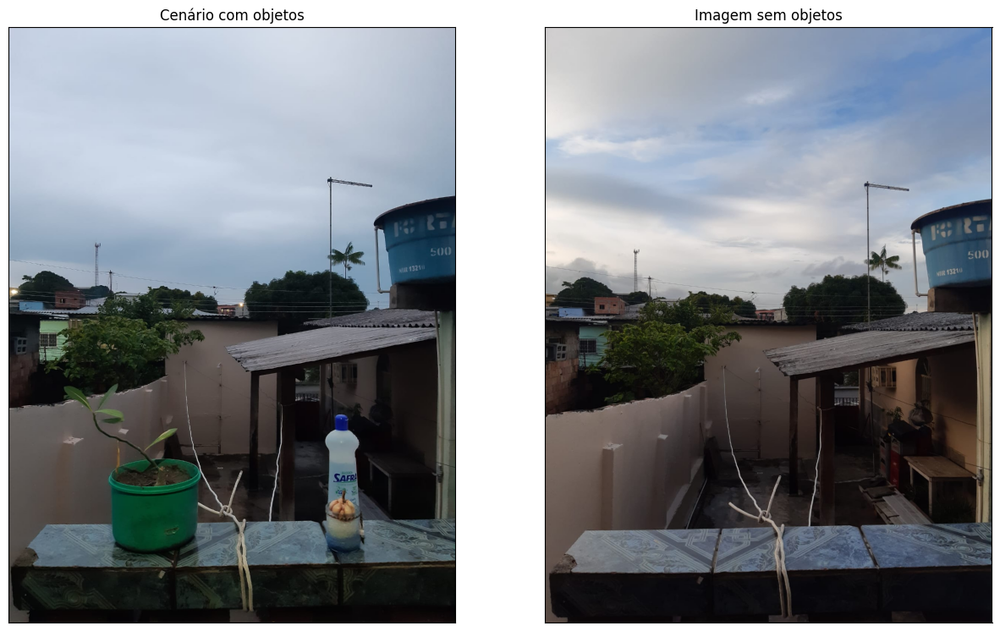

In [31]:
plot_imagens_2(IMAGEM_a, "Cenário com objetos", IMAGEM_b, "Imagem sem objetos", (15,15))

### A diferença entre as imagens não fica muito perceptível, creio eu ser pela quantidade de detalhes nas imagens, o fato de estar de dia faz todo o ambiente ser iluminado.

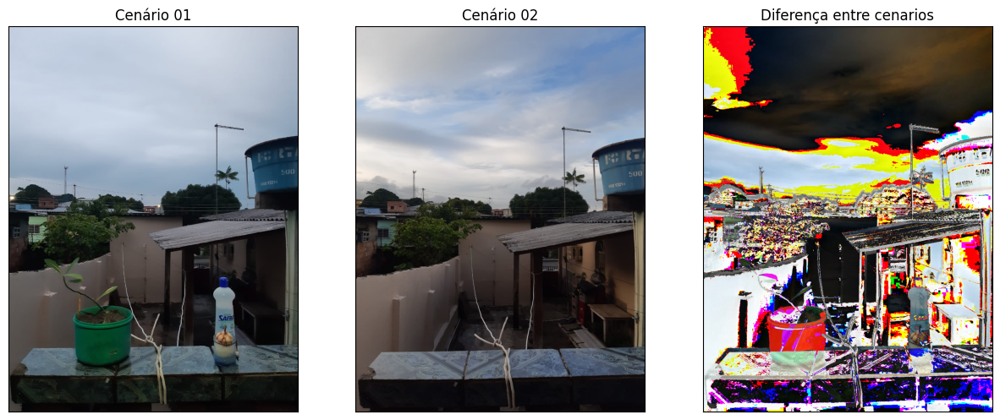

In [32]:
plot_imagens_3(IMAGEM_a, 'Cenário 01', IMAGEM_b, 'Cenário 02', (IMAGEM_a - IMAGEM_b), 'Diferença entre cenarios', (15,15))



### Aqui foi feito a diferença entre as imagens e ela ficou com as cores invertidas, pois eu troquei a posição das imagens. 

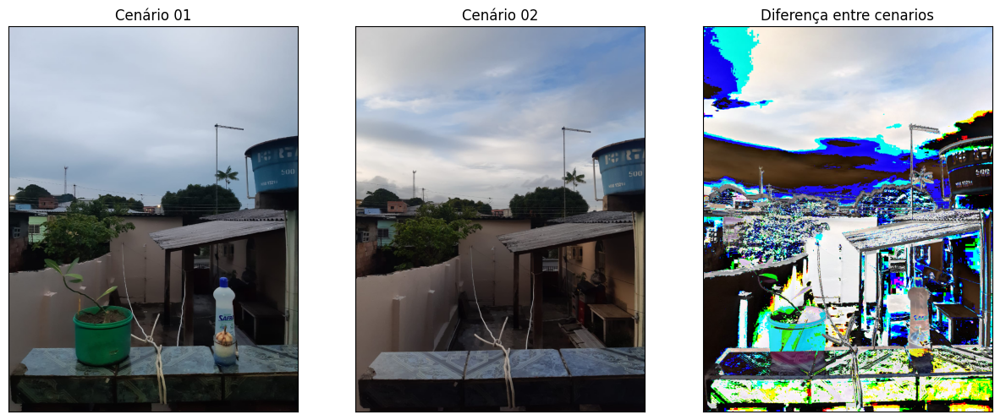

In [33]:
plot_imagens_3(IMAGEM_a, 'Cenário 01', IMAGEM_b, 'Cenário 02', (IMAGEM_b - IMAGEM_a), 'Diferença entre cenarios', (15,15))


In [73]:
IMA_hsv = cv2.cvtColor(IMAGEM_a, cv2.COLOR_RGB2HSV)
IMB_hsv = cv2.cvtColor(IMAGEM_b, cv2.COLOR_RGB2HSV)

### Aqui foi realizado o split e cada imagem abaixo é um canal do espaço de cores HSV.

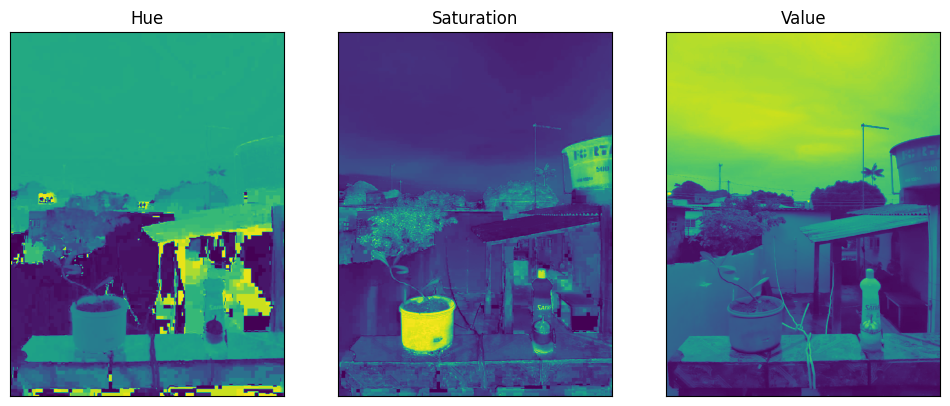

In [86]:
IMA_hue, IMA_sat, IMA_value = cv2.split(IMA_hsv)
plot_imagens_3(IMA_hue, "Hue", IMA_sat, "Saturation", IMA_value, "Value", (12,12))

### Aqui também foi realizado o split da IMB_hsv no espaco de cores HSV.

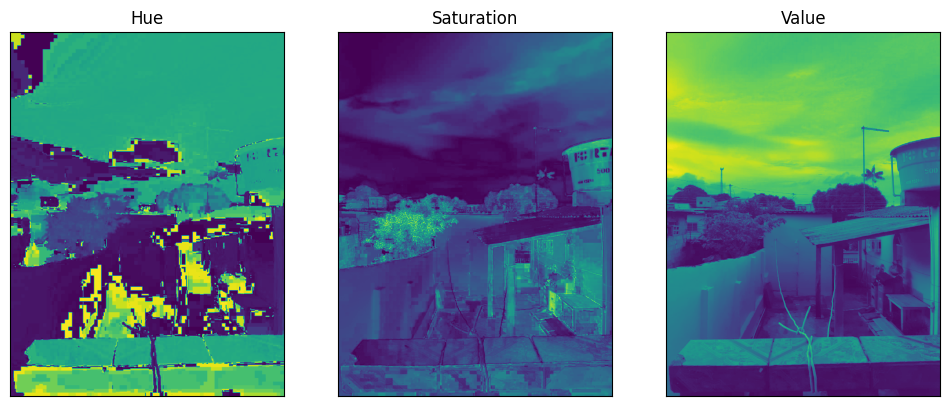

In [89]:
IMB_hue, IMB_sat, IMB_value = cv2.split(IMB_hsv)
plot_imagens_3(IMB_hue, "Hue", IMB_sat, "Saturation", IMB_value, "Value", (12,12))

### A subtração das imagens no espaço de cores hue gerou a imagem abaixo.

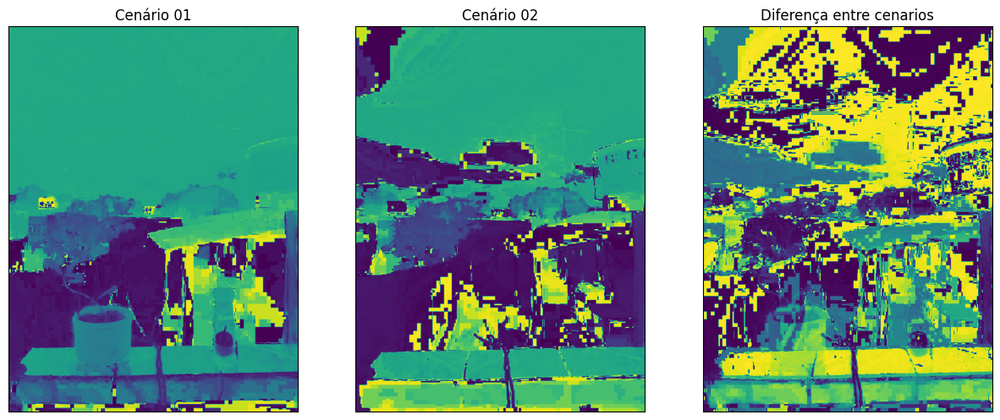

In [38]:
plot_imagens_3(IMA_hue, 'Cenário 01', IMB_hue, 'Cenário 02', (IMA_hue - IMB_hue), 'Diferença entre cenarios', (15,15))

### Na imagem do canal de saturação foi a que os objetos ficaram mais destacados e a subtração dela gerou a imagem abaixo.

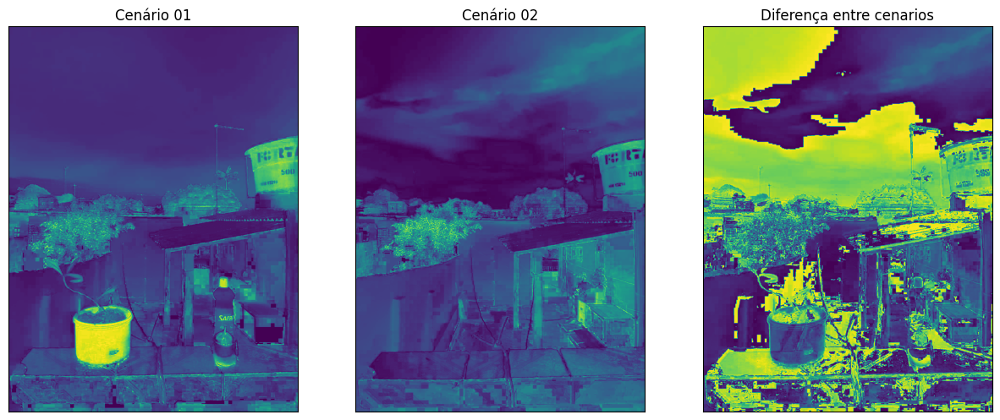

In [39]:
plot_imagens_3(IMA_sat, 'Cenário 01', IMB_sat, 'Cenário 02', (IMB_sat - IMA_sat), 'Diferença entre cenarios', (15,15))

### Na celula anterior o vaso de planta ficou mais visível no espaço de cores S, mas nessa subtração o vidro de alcool ficou mais visível.

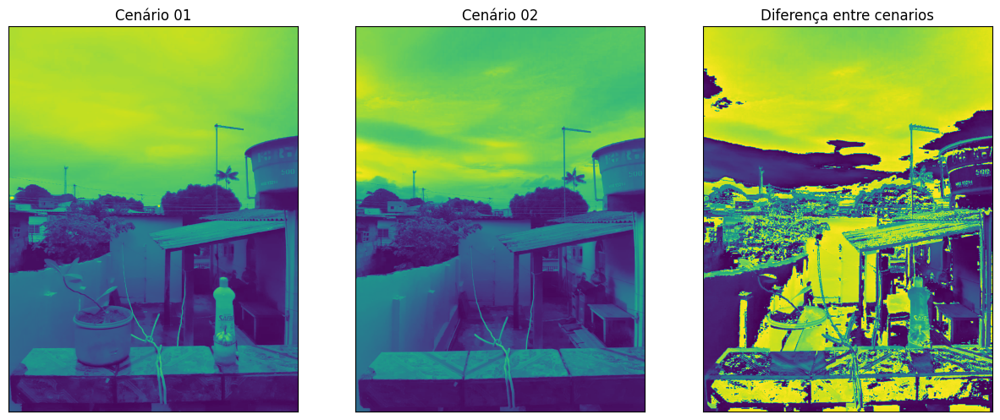

In [40]:
plot_imagens_3(IMA_value, 'Cenário 01', IMB_value, 'Cenário 02', (IMB_value - IMA_value), 'Diferença entre cenarios', (15,15))

### Segue abaixo cada subtração que foi feita.

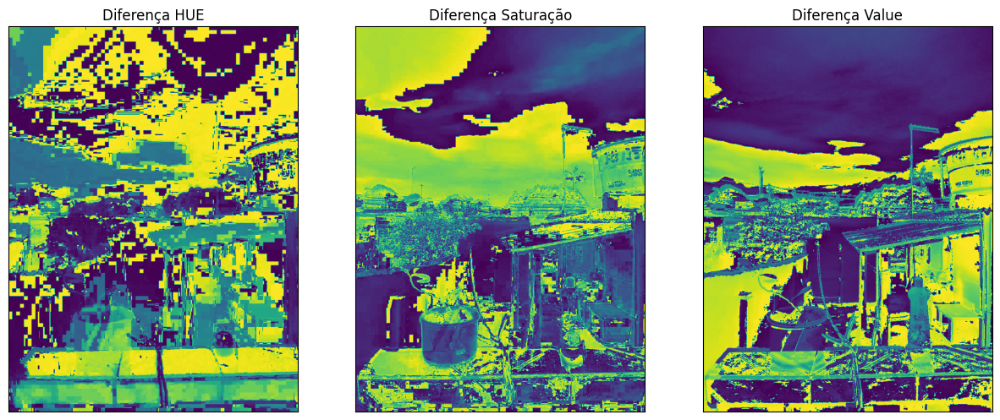

In [42]:
plot_imagens_3((IMA_hue - IMB_hue), 'Diferença HUE', (IMB_sat - IMA_sat), 'Diferença Saturação',\
               (IMA_value - IMB_value), 'Diferença Value', (15,15))

### Para cada diferença resultante foi criado uma variável e abaixo foi realizado o merge das imagens

In [94]:
imH = (IMA_hue - IMB_hue)
imS = (IMB_sat - IMA_sat)
imV = (IMA_value - IMB_value)

mergeHSV = cv2.merge((imH, imS, imV))

### O comando merge juntou as diferenças de cada imagem e o resultado está logo abaixo.  Cores quentes fizeram mais parte da imagem como um todo, a matiz de cores foi bem diversa, a saturação alta, que foi o canal que mais destacou o objeto antes da diferença. Quanto maior o valor  (value) da imagem mais brilho teve as cores.

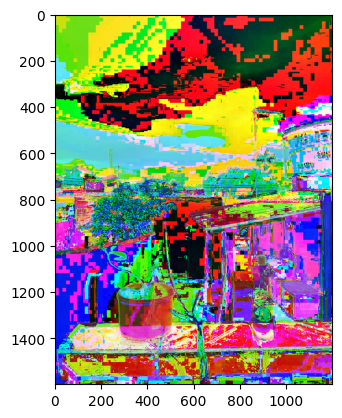

In [95]:
plt.imshow(mergeHSV)

# Imagens tiradas a noite com iluminação artificial

In [48]:
IMAGEM_C = cv2.imread(path + "IMAGEM_C.jpeg")
IMAGEM_c = cv2.cvtColor(IMAGEM_C, cv2.COLOR_BGR2RGB)

IMAGEM_D = cv2.imread(path + "IMAGEM_D.jpeg")
IMAGEM_d = cv2.cvtColor(IMAGEM_D, cv2.COLOR_BGR2RGB)

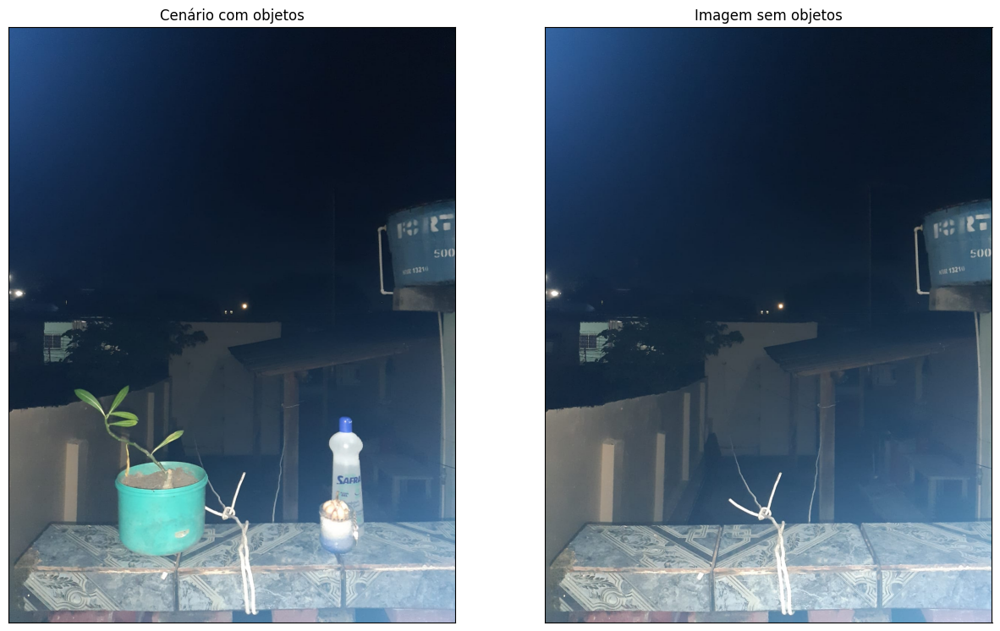

In [49]:
plot_imagens_2(IMAGEM_c, "Cenário com objetos", IMAGEM_d, "Imagem sem objetos", (15,15))

### Por algum motivo eu pensei que a imagem tirada a noite ia ser mais difícil de ver quando os objetos fossem retirados, por que achei que a falta de iluminação ia atrapalhar, mas ao contrário do que eu pensei, a falta de iluminação no fundo acabou fazendo que a luz artificial focasse apenas nos objetos, assim sendo mais fáceis de aparecerem na diferença entre eles.

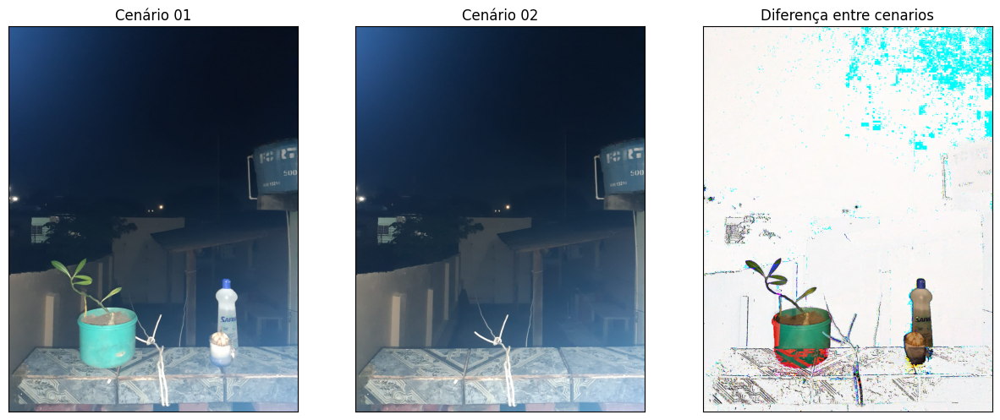

In [50]:
plot_imagens_3(IMAGEM_c, 'Cenário 01', IMAGEM_d, 'Cenário 02', (IMAGEM_c - IMAGEM_d), 'Diferença entre cenarios',  (15,15))

### Nessa segunda plotagem, fiz a subtração novamente, apenas troquei a ordem das imagens e as cores ficaram invertidas e deixou os objetos mais destacados.

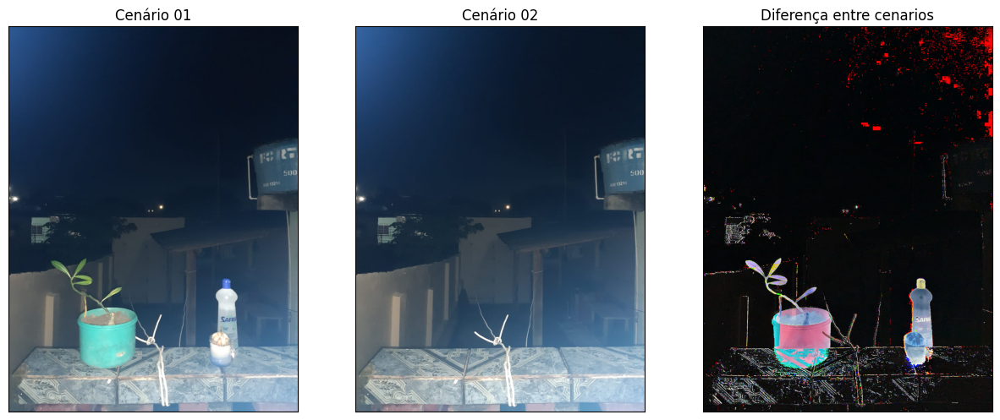

In [51]:
plot_imagens_3(IMAGEM_c, 'Cenário 01', IMAGEM_d, 'Cenário 02', (IMAGEM_d - IMAGEM_c), 'Diferença entre cenarios', (15,15))

In [52]:
IMC_hsv = cv2.cvtColor(IMAGEM_c, cv2.COLOR_RGB2HSV)
IMD_hsv = cv2.cvtColor(IMAGEM_d, cv2.COLOR_RGB2HSV)

### Nessa parte foi realizado o split com a IMC_hsv, que tem os objetos, para mostrar cada canal separado.

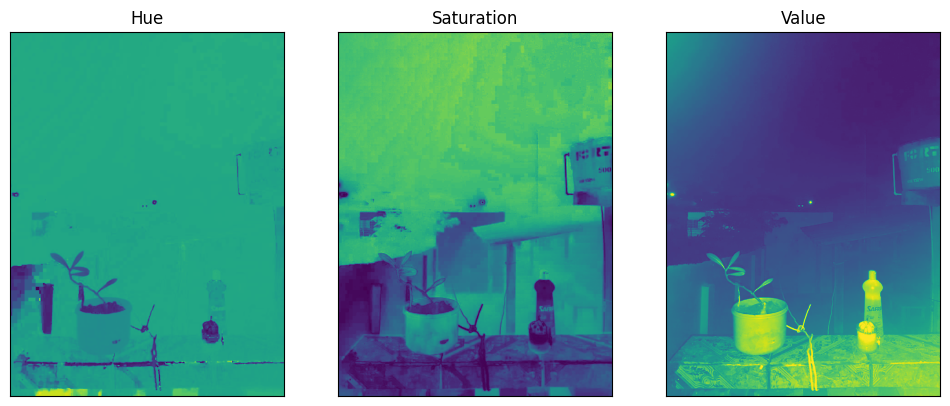

In [53]:
IMC_hue, IMC_sat, IMC_value = cv2.split(IMC_hsv)
plot_imagens_3(IMC_hue, "Hue", IMC_sat, "Saturation", IMC_value, "Value", (12,12))

### Mesma coisa foi feita na imagem do cenário sem os objetos.

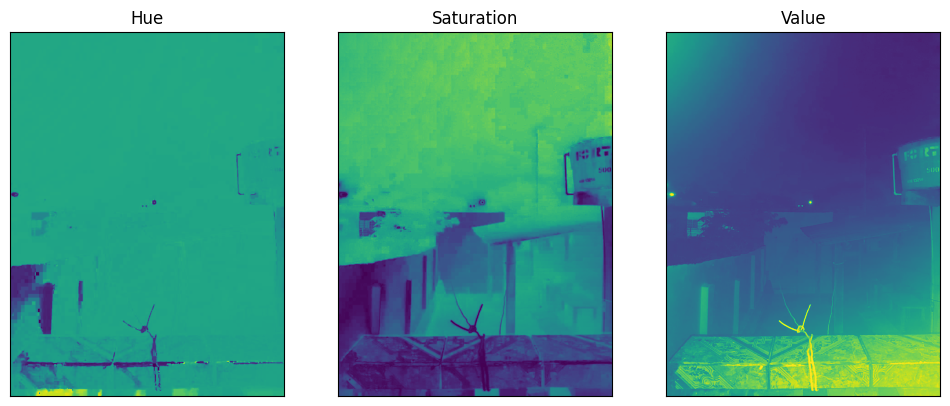

In [54]:
IMD_hue, IMD_sat, IMD_value = cv2.split(IMD_hsv)
plot_imagens_3(IMD_hue, "Hue", IMD_sat, "Saturation", IMD_value, "Value", (12,12))

### Diferença de cenários no espaço de cores sat.

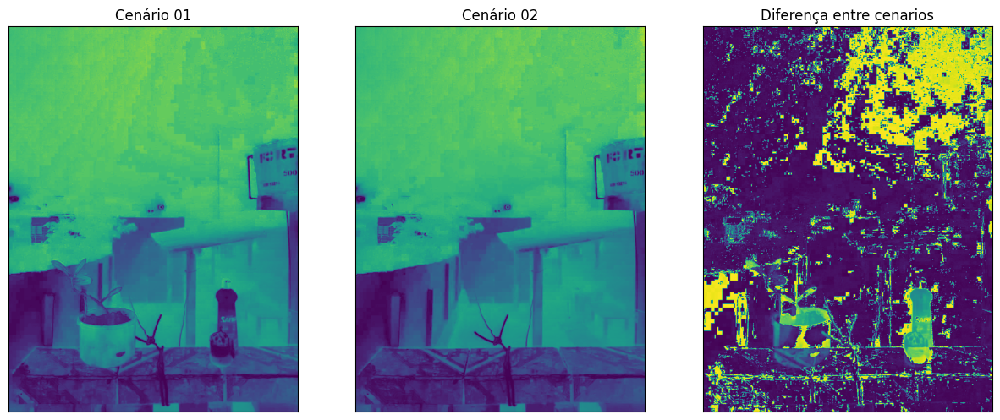

In [55]:
plot_imagens_3(IMC_sat, 'Cenário 01', IMD_sat, 'Cenário 02', (IMC_sat - IMD_sat), 'Diferença entre cenarios', (15,15))

### Diferença de cores no espaço hue.

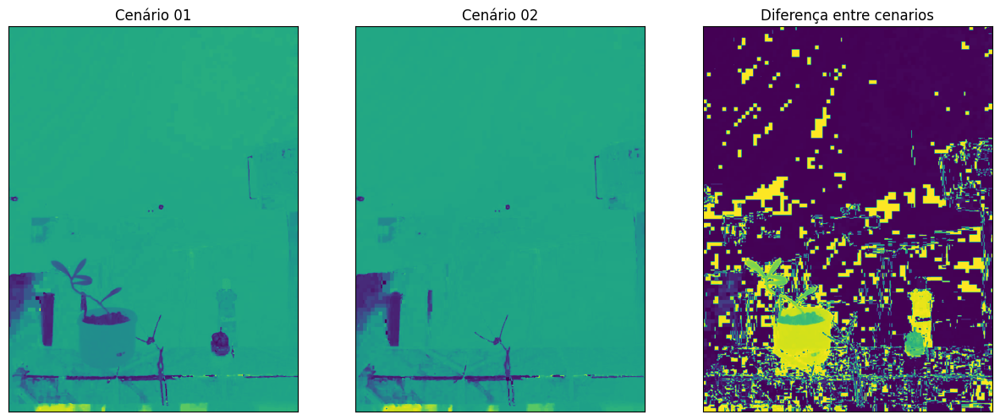

In [56]:
plot_imagens_3(IMC_hue, 'Cenário 01', IMD_hue, 'Cenário 02', (IMC_hue - IMD_hue), 'Diferença entre cenarios', (15,15))

### Diferença de cores no espaço value.

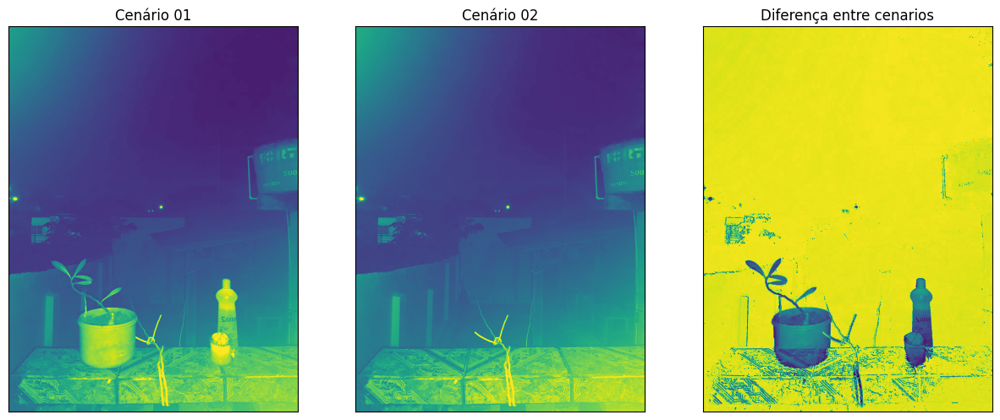

In [57]:
plot_imagens_3(IMC_value, 'Cenário 01', IMD_value, 'Cenário 02', (IMC_value - IMD_value), 'Diferença entre cenarios', (15,15))

### Dos três canais, o que ficou mais aparente as diferenças foi o numero 3, a diferença entre as imagens no espaço Value. Os objetos ficaram mais destacados e o fundo mais homogêneo. No espaço de cores value, a clareza da imagem determina a forma. Já que o maior destaque nas imagens foi os objetos e o corrimão de concreto, o destaque da diferença foi pra eles.

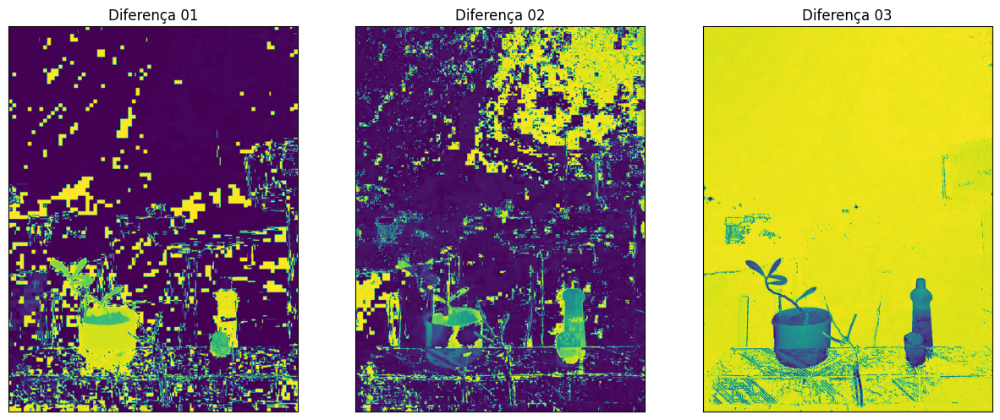

In [58]:
plot_imagens_3((IMC_hue - IMD_hue), 'Diferença 01', (IMC_sat - IMD_sat), 'Diferença 02', \
               (IMC_value - IMD_value), 'Diferença 03', (15,15))

### Para cada diferença resultante foi criado uma variável e abaixo foi realizado o merge das imagens

In [97]:
imH2 = (IMC_hue - IMD_hue)
imS2 = (IMC_sat - IMD_sat)
imV2 = (IMC_value - IMD_value)

merge2HSV = cv2.merge((imH2, imS2, imV2))

### O comando merge juntou os três canais Matiz (tonalidade), saturação, e valor (brilho). O tipo de cor predominante foi tons mais frios, ja que foi tirada a noite abrangendo todas as cores do azul até o violeta. A saturação, "pureza" da imagem, apresentou um valor normal, pois não há tons de cinza. O value(brilho), que foi o tratamento que mais destacou os objetos, é o que definiu o brilho da cor.

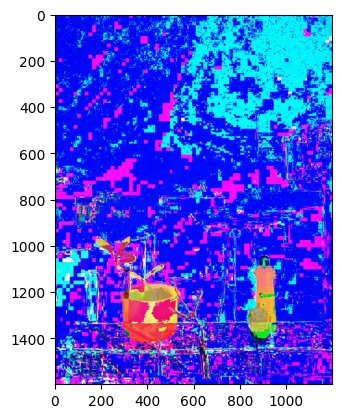

In [98]:
plt.imshow(merge2HSV)

# Comparações de resultado

### Na primeira comparação de fotos, as imagens tiradas durante o dia apresentaram mais detalhes e foi um pouco mais dificil de identificar um tratamento que pudesse mostrar com clareza a diferença de cenários quando se tira os objetos. Quando foi separado os canais de cores HSV, o canal de saturação destacou mais os objetos, mas na diferença entre eles não ficou tão perceptivel.


### As imagens tiradas a noite com os mesmos objetos foi bem mais fácil de visualizar após a subtração feita entre elas. O tratamento no espaço de cores HSV que teve mais visibilidade foi o canal value. Nele a subtração das imagens tratadas ficou mais aparente e foi o que pude identificar melhor os objetos que foram retirados de uma das imagens.

